# Set up
## Load modules and define helper functions

In [1]:
import xarray as xr
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.patches as patches
from matplotlib.patches import Polygon
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
from scipy.signal import convolve
import string

import scipy as sp
import scipy.ndimage 
from xhistogram.xarray import histogram
import gcm_filters

import torch
import torch.nn as nn
import random
import xrft
from torch.utils.data import DataLoader, TensorDataset
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
import matplotlib.ticker as ticker
import cmocean as cm
import cmocean.cm as cmo
import cartopy.crs as ccrs

from utils import *
from train import *
from loss import *
from unet import *

from scipy.optimize import curve_fit
import warnings
from matplotlib.colors import BoundaryNorm
from matplotlib.colors import LinearSegmentedColormap

# Pytorch imports
import torch
import torch.nn as nn
import numpy as np
import xarray as xr
from torch.utils.data import TensorDataset, DataLoader
from train import apply_inverse_zca_whitening_4d_torch
from unet import UNet
from utils import *
import os

import warnings
warnings.filterwarnings("ignore")

def prepare_dataloader(ssh_data, min_vals, max_vals, batch_size):
    """Prepare normalized data and DataLoader for a given SSH sample."""
    x_original = torch.from_numpy(ssh_data.values).float().unsqueeze(0).unsqueeze(0).to(device)
    x_normalized, _, _ = min_max_normalize(x_original, min_vals, max_vals)
    y_dummy = torch.zeros_like(x_original).repeat(1, 2, 1, 1)
    dataset = TensorDataset(x_normalized, y_dummy)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    return loader, x_original

def evaluate_model(model, dataloader, x_original, Vt, scale, mean, n_samples, device):
    """Run model evaluation and generate predictions."""
    results = {
        'ssh': [], 'ubm_true': [], 'bm_true': [],
        'ubm_pred_mu': [], 'bm_pred_mu': [],
        'ubm_pred_ensembles': [], 'bm_pred_ensembles': []
    }
    
    with torch.no_grad():
        for i, (batch_x, _) in enumerate(dataloader):
            batch_start = i * dataloader.batch_size
            batch_end = min(batch_start + dataloader.batch_size, len(dataloader.dataset))
            current_indices = list(range(batch_start, batch_end))
            
            batch_x = batch_x.to(device)
            outputs = model(torch.nan_to_num(batch_x))
            ssh_batch_original = x_original[current_indices]
            
            # Predicted mean
            mu_zca = outputs[:, 0, ...]
            log_sigma_zca = outputs[:, 1, ...]
            mu_zca_expanded = mu_zca.unsqueeze(1)
            ubm_pred_mu = apply_inverse_zca_whitening_4d_torch(mu_zca_expanded, Vt, scale, mean)
            bm_pred_mu = ssh_batch_original - ubm_pred_mu
            
            # Generate ensemble samples
            zca_samples = generate_gaussian_samples(mu_zca, log_sigma_zca, n_samples=n_samples)
            B, n_samp, H, W = zca_samples.shape
            zca_samples_flat = zca_samples.reshape(B * n_samp, 1, H, W)
            ubm_samples_flat = apply_inverse_zca_whitening_4d_torch(zca_samples_flat, Vt, scale, mean)
            ubm_samples = ubm_samples_flat.reshape(B, n_samp, 1, H, W)
            
            ssh_expanded = ssh_batch_original.unsqueeze(1).expand(-1, n_samp, -1, -1, -1)
            bm_samples = ssh_expanded - ubm_samples
            
            # Store results (use placeholders for true values)
            results['ssh'].append(ssh_batch_original.cpu().numpy())
            results['ubm_true'].append(ssh_batch_original.cpu().numpy())  # Placeholder
            results['bm_true'].append(torch.zeros_like(ssh_batch_original).cpu().numpy())  # Placeholder
            results['ubm_pred_mu'].append(ubm_pred_mu.cpu().numpy())
            results['bm_pred_mu'].append(bm_pred_mu.cpu().numpy())
            results['ubm_pred_ensembles'].append(ubm_samples.cpu().numpy())
            results['bm_pred_ensembles'].append(bm_samples.cpu().numpy())
    
    # Concatenate all batches
    for key in results:
        results[key] = np.concatenate(results[key], axis=0)
    
    return results

def create_evaluation_datasets(ssh_list, region_name, model, min_vals, max_vals, 
                               Vt, scale, mean, batch_size, n_samples, device):
    """Process all SSH samples in a list and return evaluation datasets."""
    all_datasets = {}
    
    for idx, ssh_data in enumerate(ssh_list):
        print(f"Processing {region_name} sample {idx+1}/{len(ssh_list)}...")
        
        # Prepare data
        dataloader, x_original = prepare_dataloader(ssh_data, min_vals, max_vals, batch_size)
        
        # Evaluate model
        results = evaluate_model(model, dataloader, x_original, Vt, scale, mean, n_samples, device)
        
        # Create evaluation dataset
        model_name = f"{region_name}_{idx}"
        eval_dataset = create_evaluation_dataset(
            results, model_name, 
            has_ensembles=True, 
            has_sst=False, 
            stochastic_samples=n_samples
        )
        
        all_datasets[model_name] = eval_dataset
    
    return all_datasets

# --- Reconstruction / Stitching Logic ---
def stitch_chunks_back(datasets_dict, base_ds, chunk_size_j, chunk_size_i, i_start=5):
    """
    Reconstruct full SSH fields from individual chunk results.
    """
    j_len = base_ds.dims['j']
    i_len = base_ds.dims['i']

    # Initialize empty arrays for stitched outputs
    full_ubm_pred_mu = np.full((j_len, i_len), np.nan)
    full_bm_pred_mu = np.full((j_len, i_len), np.nan)

    # Retrieve coordinates
    j_coords = base_ds.j.values
    i_coords = base_ds.i.values

    # Sort keys in natural order (assuming sequential chunk names)
    keys_sorted = sorted(datasets_dict.keys(), key=lambda x: int(x.split('_')[-1]))

    # Determine how many chunks we had
    n_chunks = len(keys_sorted)
    print(f"Stitching {n_chunks} chunks back into full grid...")

    # Recreate j_start list (same as used earlier)
    print("j_len",j_len)
    print("chunk_size_j",chunk_size_j)
    j_starts = list(range(0, j_len, chunk_size_j))
    print(f"j_starts {j_starts}")

    for idx, key in enumerate(keys_sorted):
        if idx > 25:
            continue
        print(f"idx {idx}, key {key}")
        ds_eval = datasets_dict[key]
        ubm_mu = ds_eval['ubm_pred_mean'].values.squeeze()  # (80,80)
        bm_mu = ds_eval['bm_pred_mean'].values.squeeze()

        # Determine spatial indices
        j_start = j_starts[idx]
        j_end = min(j_start + chunk_size_j, j_len)
        i_end = min(i_start + chunk_size_i, i_len)

        # Fill reconstructed arrays
        full_ubm_pred_mu[j_start:j_end, i_start:i_end] = ubm_mu[:j_end-j_start, :i_end-i_start]
        full_bm_pred_mu[j_start:j_end, i_start:i_end] = bm_mu[:j_end-j_start, :i_end-i_start]

    # Convert to xarray
    stitched_ds = xr.Dataset({
        "ubm_pred_mean": (("j", "i"), full_ubm_pred_mu),
        "bm_pred_mean": (("j", "i"), full_bm_pred_mu),
    },
    coords={"j": j_coords, "i": i_coords})

    print("✅ Successfully stitched full dataset.")
    return stitched_ds



def calculate_geostrophic_velocities(eta, f, g, dx, dy):
    """Compute u, v from SSH field via geostrophy."""
    deta_dx = np.zeros_like(eta)*np.nan
    deta_dy = np.zeros_like(eta)*np.nan
    
    # interior: central differences
    print("deta_dx.shape",deta_dx.shape)
    print("deta_dy.shape",deta_dy.shape)
    print("eta.shape",eta.shape)
    deta_dx[:, 1:-1] = (eta[:, 2:] - eta[:, :-2]) / (2 * dx)
    deta_dy[1:-1, :] = (eta[2:, :] - eta[:-2, :]) / (2 * dy)
    # deta_dx[:, 2:-2] = (eta[:, 2:] - eta[:, :-2]) / (2 * dx)
    # deta_dy[2:-2, :] = (eta[2:, :] - eta[:-2, :]) / (2 * dy)
    
    # boundaries: forward/backward
    deta_dx[:, 0] = (eta[:, 1] - eta[:, 0]) / dx
    deta_dx[:, -1] = (eta[:, -1] - eta[:, -2]) / dx
    deta_dy[0, :] = (eta[1, :] - eta[0, :]) / dy
    deta_dy[-1, :] = (eta[-1, :] - eta[-2, :]) / dy

    #print("f.shape",f.shape)
    print("deta_dy.shape",deta_dy.shape)
    print("deta_dx.shape",deta_dx.shape)    
    u = - (g / f) * deta_dy
    v = (g / f) * deta_dx
    print("u.shape", u.shape)
    print("v.shape", v.shape)

    u[79::80,:] = np.nan
    u[80::80,:] = np.nan
    v[79::80,:] = np.nan
    v[80::80,:] = np.nan
    
    return u, v

def calculate_flow_properties(u, v, dx, dy):
    """Compute vorticity and strain from (u, v)."""
    du_dx = np.zeros_like(u)
    du_dy = np.zeros_like(u)
    dv_dx = np.zeros_like(v)
    dv_dy = np.zeros_like(v)

    print("du_dx.shape",du_dx.shape)
    print("u.shape",u.shape)
    print("dv_dx.shape",dv_dx.shape)
    print("v.shape",v.shape)
    # interior central differences
    print("du_dx[:, 1:-1].shape",du_dx[:, 1:-1].shape)
    print("u[:, 2:].shape",u[:, 2:].shape)
    print("u[:, :-2]).shape",u[:, :-2].shape)
    print("dx",dx)
    print("(du_dx[:, 1:-1] + u[:, 2:]).shape",(du_dx[:, 1:-1] + u[:, 2:]).shape)
    du_dx[:, 1:-1] = (u[:, 2:] - u[:, :-2]) / (2 * dx)
    du_dy[1:-1, :] = (u[2:, :] - u[:-2, :]) / (2 * dy)
    dv_dx[:, 1:-1] = (v[:, 2:] - v[:, :-2]) / (2 * dx)
    dv_dy[1:-1, :] = (v[2:, :] - v[:-2, :]) / (2 * dy)
    
    # boundaries (similar logic)
    # dx boundaries
    du_dx[:, 0] = (u[:, 1] - u[:, 0]) / dx
    du_dx[:, -1] = (u[:, -1] - u[:, -2]) / dx
    dv_dx[:, 0] = (v[:, 1] - v[:, 0]) / dx
    dv_dx[:, -1] = (v[:, -1] - v[:, -2]) / dx
    # dy boundaries
    du_dy[0, :] = (u[1, :] - u[0, :]) / dy
    du_dy[-1, :] = (u[-1, :] - u[-2, :]) / dy
    dv_dy[0, :] = (v[1, :] - v[0, :]) / dy
    dv_dy[-1, :] = (v[-1, :] - v[-2, :]) / dy
    
    vorticity = dv_dx - du_dy
    strain_normal = du_dx - dv_dy
    strain_shear = dv_dx + du_dy
    strain = np.sqrt(strain_normal**2 + strain_shear**2)
    
    return vorticity, strain

def compute_derived_fields(ssh, ubm, f = -9.37e-5 ,nan_mask=None):
    """
    Given SSH and UBM (2D arrays), compute BM = ssh - ubm and 
    velocities, speed, vorticity, strain, etc.
    Optionally mask using nan_mask (1 for valid, 0 for invalid).
    Returns a dict of arrays.
    """
    bm = ssh - ubm
    
    # velocities
    u_ssh, v_ssh = calculate_geostrophic_velocities(ssh, f, g, dx, dy)
    u_bm, v_bm = calculate_geostrophic_velocities(bm, f, g, dx, dy)
    u_ubm, v_ubm = calculate_geostrophic_velocities(ubm, f, g, dx, dy)
    
    # speeds
    speed_ssh = np.sqrt(u_ssh**2 + v_ssh**2)
    speed_bm  = np.sqrt(u_bm**2 + v_bm**2)
    speed_ubm = np.sqrt(u_ubm**2 + v_ubm**2)
    
    # vorticities & strain
    vort_ssh, strain_ssh   = calculate_flow_properties(u_ssh, v_ssh, dx, dy)
    vort_bm, strain_bm     = calculate_flow_properties(u_bm, v_bm, dx, dy)
    vort_ubm, strain_ubm   = calculate_flow_properties(u_ubm, v_ubm, dx, dy)
    
    # Apply mask if given
    if nan_mask is not None:
        # multiply so masked-out cells become zero / nan
        for arr in [ubm, speed_ubm, vort_ubm, strain_ubm]:
            arr[:] = arr * nan_mask
            arr[::,::]
    
    return {
        'ssh': ssh,
        'bm': bm,
        'ubm': ubm,
        
        'speed_ssh': speed_ssh,
        'speed_bm': speed_bm,
        'speed_ubm': speed_ubm,
        
        'vort_ssh': vort_ssh,
        'vort_bm': vort_bm,
        'vort_ubm': vort_ubm,
        
        'strain_ssh': strain_ssh,
        'strain_bm': strain_bm,
        'strain_ubm': strain_ubm
    }


# Define a function to calculate the PSD if it's not already defined
def calculate_psd_km(field, dx_km=1.5):
    """
    Calculate the 2D Power Spectral Density and convert to 1D radial average.
    
    Parameters:
    -----------
    field : 2D numpy array
        The input field (e.g., SSH, BM, UBM)
    dx_km : float
        Grid spacing in kilometers
        
    Returns:
    --------
    psd_1d : numpy array
        1D radially averaged power spectrum
    freq_r : numpy array
        Corresponding radial frequencies in cycles/km
    """
    # Get dimensions
    ny, nx = field.shape
    
    # Apply Hann window to reduce edge effects
    window = np.outer(np.hanning(ny), np.hanning(nx))
    field_windowed = field * window
    
    # Compute 2D FFT and shift zero frequency to center
    fft2 = np.fft.fft2(field_windowed)
    fft2_shifted = np.fft.fftshift(fft2)
    
    # Calculate the Power Spectral Density
    psd2d = np.abs(fft2_shifted)**2
    
    # Normalize by number of points and grid spacing
    psd2d = psd2d / (nx * ny) * (dx_km**2)
    
    # Create frequency grids
    freq_x = np.fft.fftshift(np.fft.fftfreq(nx, d=dx_km))
    freq_y = np.fft.fftshift(np.fft.fftfreq(ny, d=dx_km))
    
    # Create meshgrid for radial binning
    kx, ky = np.meshgrid(freq_x, freq_y)
    k_rad = np.sqrt(kx**2 + ky**2)
    
    # Create radial bins
    max_freq = np.max(k_rad)
    n_bins = min(nx, ny) // 2
    freq_bins = np.linspace(0, max_freq, n_bins+1)
    
    # Calculate bin centers
    freq_r = (freq_bins[1:] + freq_bins[:-1]) / 2
    
    # Initialize output array
    psd_1d = np.zeros(n_bins)
    
    # Radial binning
    for i in range(n_bins):
        bin_mask = (k_rad >= freq_bins[i]) & (k_rad < freq_bins[i+1])
        if np.any(bin_mask):
            psd_1d[i] = np.mean(psd2d[bin_mask])
    
    return psd_1d, freq_r

def calculate_ensemble_psd_envelope(ensemble_samples, dx_km=1.5):
    """
    Calculate PSD envelope (min/max/percentiles) from ensemble samples
    
    Parameters:
    -----------
    ensemble_samples : numpy array
        Shape: (n_samples, height, width) - ensemble predictions
    dx_km : float
        Grid spacing in kilometers
    
    Returns:
    --------
    psd_envelope : dict
        Dictionary containing 'min', 'max', 'p25', 'p75', 'median' PSDs
    freq_r : numpy array
        Corresponding radial frequencies
    """
    n_samples = ensemble_samples.shape[0]
    
    # Calculate PSD for each ensemble member
    psd_list = []
    for i in range(n_samples):
        psd_1d, freq_r = calculate_psd_km(ensemble_samples[i], dx_km)
        psd_list.append(psd_1d)
    
    # Stack all PSDs
    psd_array = np.stack(psd_list, axis=0)  # Shape: (n_samples, n_freq)
    
    # Calculate envelope statistics
    psd_envelope = {
        'min': np.min(psd_array, axis=0),
        'max': np.max(psd_array, axis=0),
        'p25': np.percentile(psd_array, 25, axis=0),
        'p75': np.percentile(psd_array, 75, axis=0),
        'median': np.median(psd_array, axis=0)
    }
    
    return psd_envelope, freq_r


# —————————————————————————————————————————————
# 2. Plotting / Visualization Module
# —————————————————————————————————————————————

def plot_map_swath(ds, varname='ssha_filtered', subregions=None, fig=None, ax=None, vmin=None, vmax=None, title=None):
    """
    Plot a map of ds[varname] over the original swath (with lon/lat coords),
    optionally overlay subregions polygons from subregions dict.
    """
    if fig is None or ax is None:
        fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
    
    im = ax.pcolor(ds.longitude, ds.latitude, ds[varname],
                   cmap=cmo.balance, vmin=vmin, vmax=vmax,
                   transform=ccrs.PlateCarree())
    
    if subregions is not None:
        for label, region in subregions.items():
            lon_b, lat_b = extract_polygon_boundary(ds, region['j'], region['i'])
            poly = Polygon(np.column_stack([lon_b, lat_b]),
                           linewidth=2, edgecolor='red', facecolor='none',
                           transform=ccrs.PlateCarree())
            ax.add_patch(poly)
            lon_c, lat_c = get_region_center(ds, region['j'], region['i'])
            ax.text(lon_c, lat_c, label, fontsize=14, color='red',
                    ha='center', va='center', transform=ccrs.PlateCarree())
    
    ax.coastlines()
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'fontsize': 12}
    gl.ylabel_style = {'fontsize': 12}
    
    if title:
        ax.set_title(title, fontsize=16, pad=10)
    return fig, ax, im

def plot_sample_fields(fields, region_name, dx_km, save_path=None, sample_scaling=1.0):
    """
    Plot one sample’s fields in a 2×3 layout:
    [SSH, BM, UBM] on top row; [speed SSH, speed BM, speed UBM] bottom.
    """
    fig = plt.figure(figsize=(15, 9))
    gs = gridspec.GridSpec(2, 3, hspace=0.35, wspace=0.35,
                          left=0.08, right=0.95, top=0.92, bottom=0.08)
    axes = [[fig.add_subplot(gs[i, j]) for j in range(3)] for i in range(2)]
    
    # Row 0
    im00 = axes[0][0].imshow(fields['ssh'], cmap=cmo.balance,
                             vmin=-0.4*sample_scaling, vmax=0.4*sample_scaling,
                             extent=[0, fields['ssh'].shape[1], 0, fields['ssh'].shape[0]])
    #format_axes_professional(axes[0][0], 'SSH (SWOT)', dx_km)
    
    im01 = axes[0][1].imshow(fields['bm'], cmap=cmo.balance,
                             vmin=-0.4*sample_scaling, vmax=0.4*sample_scaling,
                             extent=[0, fields['bm'].shape[1], 0, fields['bm'].shape[0]])
    #format_axes_professional(axes[0][1], 'BM Pred Mean', dx_km)
    
    im02 = axes[0][2].imshow(fields['ubm'], cmap=cmo.balance,
                             vmin=-0.01*sample_scaling, vmax=0.01*sample_scaling,
                             extent=[0, fields['ubm'].shape[1], 0, fields['ubm'].shape[0]])
    #format_axes_professional(axes[0][2], 'UBM Pred Mean', dx_km)
    
    # Row 1 (speed)
    im10 = axes[1][0].imshow(fields['speed_ssh'], cmap=cmo.thermal,
                             vmin=0, vmax=1*sample_scaling,
                             extent=[0, fields['ssh'].shape[1], 0, fields['ssh'].shape[0]])
    #format_axes_professional(axes[1][0], 'SSH GSpeed', dx_km)
    
    im11 = axes[1][1].imshow(fields['speed_bm'], cmap=cmo.thermal,
                             vmin=0, vmax=1*sample_scaling,
                             extent=[0, fields['bm'].shape[1], 0, fields['bm'].shape[0]])
    #format_axes_professional(axes[1][1], 'BM GSpeed', dx_km)
    
    im12 = axes[1][2].imshow(fields['speed_ubm'], cmap=cmo.thermal,
                             vmin=0, vmax=0.2*sample_scaling,
                             extent=[0, fields['ubm'].shape[1], 0, fields['ubm'].shape[0]])
    #format_axes_professional(axes[1][2], 'UBM GSpeed', dx_km)
    
    # Labels
    for ax in axes[1]:
        ax.set_xlabel('Cross-swath distance (km)', fontsize=15)
    for ax in [axes[0][0], axes[1][0]]:
        ax.set_ylabel('Along-swath distance (km)', fontsize=15)
    
    # Colorbars
    """
    add_professional_colorbar(fig, axes[0][0], im00, 'SSH (m)', 'both', 14, 'ssh', sample_scaling)
    add_professional_colorbar(fig, axes[0][1], im01, 'SSH (m)', 'both', 14, 'ssh', sample_scaling)
    add_professional_colorbar(fig, axes[0][2], im02, 'SSH (m)', 'both', 14, 'ubm', sample_scaling)
    add_professional_colorbar(fig, axes[1][0], im10, 'Velocity (m/s)', 'max', 14, 'speed', sample_scaling)
    add_professional_colorbar(fig, axes[1][1], im11, 'Velocity (m/s)', 'max', 14, 'speed', sample_scaling)
    add_professional_colorbar(fig, axes[1][2], im12, 'Velocity (m/s)', 'max', 14, 'speed_ubm', sample_scaling)
    """
    fig.suptitle(region_name, fontsize=20, fontweight='bold', y=1.03)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close()

# —————————————————————————————————————————————
# 3. Example “driver” using your stitched outputs
# —————————————————————————————————————————————

def analyze_and_plot_stitched(stitched_ds, save_dir=None, subregions=None):
    """
    Given a stitched dataset (xarray) with fields:
      - stitched_ds.ubm_pred_mu
      - stitched_ds.bm_pred_mu
    and original dataset ds (for ssh), etc., this function:
     1. Computes derived fields
     2. Plots map + fields
    """
    # Example: original SSH (from your original datasets dictionary):
    # you might want to pass the original ds too, but assume stitched_ds has same coords
    
    # For demonstration, let’s assume `ssh_full` is in stitched_ds or from original ds
    ssha_filtered = stitched_ds.ssha_filtered.values  # you need to have included this or pass separately
    ssha_filtered_smoothed = stitched_ds.ssha_filtered_smoothed.values  # you need to have included this or pass separately
    
    ubm_full = stitched_ds.ubm_pred_mean.values
    ubm_smoothed_full = stitched_ds.ubm_smoothed_pred_mean.values
    
    nan_mask = 1#(~np.isnan(ssha_filtered)).astype(float)
    nan_mask_smoothed = 1#(~np.isnan(ssha_filtered_smoothed)).astype(float)
    
    fields = compute_derived_fields(ssha_filtered, 
                                    ubm_full,
                                    f=-2*7.2921e-5*np.sin(stitched_ds.latitude.values*np.pi/180), 
                                    nan_mask=nan_mask)

    fields_smoothed = compute_derived_fields(ssha_filtered_smoothed, 
                                            ubm_smoothed_full,
                                            f=-2*7.2921e-5*np.sin(stitched_ds.latitude.values*np.pi/180), 
                                            nan_mask=nan_mask_smoothed)
    
    stitched_ds["bm"] = stitched_ds.ssha_filtered*0+fields["bm"]
    stitched_ds["ubm"] = stitched_ds.ssha_filtered*0+fields["ubm"]
    stitched_ds["speed_ssh"] = stitched_ds.ssha_filtered*0+fields["speed_ssh"]
    stitched_ds["speed_ubm"] = stitched_ds.ssha_filtered*0+fields["speed_ubm"]
    stitched_ds["speed_bm"] = stitched_ds.ssha_filtered*0+fields["speed_bm"]
    stitched_ds["vort_ssh"] = stitched_ds.ssha_filtered*0+fields["vort_ssh"]
    stitched_ds["vort_bm"] = stitched_ds.ssha_filtered*0+fields["vort_bm"]
    stitched_ds["vort_ubm"] = stitched_ds.ssha_filtered*0+fields["vort_ubm"]
    stitched_ds["strain_ssh"] = stitched_ds.ssha_filtered*0+fields["strain_ssh"]
    stitched_ds["strain_bm"] = stitched_ds.ssha_filtered*0+fields["strain_bm"]
    stitched_ds["strain_ubm"] = stitched_ds.ssha_filtered*0+fields["strain_ubm"]

    stitched_ds["bm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["bm"]
    stitched_ds["ubm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["ubm"]
    stitched_ds["speed_ssh_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["speed_ssh"]
    stitched_ds["speed_ubm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["speed_ubm"]
    stitched_ds["speed_bm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["speed_bm"]
    stitched_ds["vort_ssh_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["vort_ssh"]
    stitched_ds["vort_bm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["vort_bm"]
    stitched_ds["vort_ubm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["vort_ubm"]
    stitched_ds["strain_ssh_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["strain_ssh"]
    stitched_ds["strain_bm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["strain_bm"]
    stitched_ds["strain_ubm_smoothed"] = stitched_ds.ssha_filtered_smoothed*0+fields_smoothed["strain_ubm"]
    
    # Plot the map of SSH (background) with region polygons if desired
    """
    fig, ax, im = plot_map_swath(stitched_ds, varname="ssha_filtered_smoothed",
                                subregions=subregions,
                                title="Full-swath SSH")
    cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    cbar.set_label("SSH (m)")
    """
    
    # Now for a selected subregion or tile, you can call plot_sample_fields:
    # e.g., select a tile slice:
    # tile_fields = {k: fields[k][j0:j1, i0:i1] for k in fields}
    # plot_sample_fields(tile_fields, region_name="Tile_0", dx_km=dx_km, save_path=...)
    
    return stitched_ds


def calculate_psd_xrft_km(field, dx_km=1.5):
    isospec = xrft.xrft.isotropic_power_spectrum(field.assign_coords({"i":np.arange(0,120,1.5),"j":np.arange(0,120,1.5),}),
                                                 dim=['j','i'],
                                                 detrend="linear",
                                                 window="hann",
                                                 truncate=True,
                                                 nfactor=2,
                                                 
                                                 
                                                )
    return isospec.values, isospec.freq_r
        

def calculate_ensemble_psd_envelope(ensemble_samples, dx_km=1.5):
    """
    Calculate PSD envelope (min/max/percentiles) from ensemble samples
    
    Parameters:
    -----------
    ensemble_samples : numpy array
        Shape: (n_samples, height, width) - ensemble predictions
    dx_km : float
        Grid spacing in kilometers
    
    Returns:
    --------
    psd_envelope : dict
        Dictionary containing 'min', 'max', 'p25', 'p75', 'median' PSDs
    freq_r : numpy array
        Corresponding radial frequencies
    """
    n_samples = ensemble_samples.shape[0]
    
    # Calculate PSD for each ensemble member
    psd_list = []
    for i in range(n_samples):
        psd_1d, freq_r = calculate_psd_xrft_km(ensemble_samples[i], dx_km)
        psd_list.append(psd_1d)
    
    # Stack all PSDs
    psd_array = np.stack(psd_list, axis=0)  # Shape: (n_samples, n_freq)
    
    # Calculate envelope statistics
    psd_envelope = {
        'min': np.min(psd_array, axis=0),
        'max': np.max(psd_array, axis=0),
        'p25': np.percentile(psd_array, 25, axis=0),
        'p75': np.percentile(psd_array, 75, axis=0),
        'median': np.median(psd_array, axis=0)
    }
    
    return psd_envelope, freq_r

# --- GAUSSIAN WINDOW SMOOTHING KILL NANS ---
def nan_gaussian_convolve2d(arr,sigma=3.5,truncate=4):
    arr_na = arr.copy()
    arr_na.values[np.isnan(arr.values)] = 0
    arr_0na_filtered = sp.ndimage.gaussian_filter(arr_na,sigma=sigma,truncate=truncate)
    arr_1na = 0*arr.copy()+1
    arr_1na.values[np.isnan(arr.values)] = 0
    arr_1na_filtered = sp.ndimage.gaussian_filter(arr_1na,sigma=sigma,truncate=truncate)
    return arr_0na_filtered/arr_1na_filtered

def nan_gaussian_convolve2d_othermethod(arr, sigma=3.5, truncate=4):
    arr_na = arr.copy()
    masked_data = np.ma.masked(arr_na, np.isnan(arr_na))
    filtered_data = sp.ndimage.gaussian_filter(masked_data, sigma=sigma, truncate=truncate)
    return filtered_data

def gcm_filter(da,wet_mask,sigma=10,):
    wet_mask[0,:] = 0
    wet_mask[:,0] = 0
    filter = gcm_filters.Filter(
    filter_scale=sigma*(12**.5),
    dx_min=1.5,
    #n_steps=0,
    filter_shape=gcm_filters.FilterShape.GAUSSIAN,
    grid_type=gcm_filters.GridType.REGULAR_WITH_LAND,
    grid_vars={'wet_mask': wet_mask}
    )
    return filter.apply(da, dims=['j', 'i'])

# Helper function: compute 2D log power spectrum
def compute_log_power_spectrum(field):
    fft_result = np.fft.fft2(field)
    power_spectrum = np.abs(fft_result) ** 2
    shifted = np.fft.fftshift(power_spectrum)
    log_power = 20 * np.log10(shifted + 1e-8)
    return log_power


def radial_profile_from_2d_ps(ps2d):
    """
    Optional helper if you still need radial bins from a 2D PS.
    (You may or may not need this with xrft output.)
    """
    radial_profile = xrft.power_spectrum(ps2d,dim=['i','j'], 
                        detrend="linear",
                        window=True
                       ).compute()
    return radial_profile


def calculate_psd_xrft(field, dx_km=1.5):
    """
    Uses xrft.isotropic_power_spectrum to compute radial PSD.
    Returns:
      psd_values : numpy array of power spectrum values (1D radial)
      freq_r      : corresponding radial frequencies
    """
    # Assuming `field` is a 2D xarray DataArray with dims ['j','i']
    isospec_kwargs = {"nfactor":2,"window":"hann","detrend":"linear","truncate":True}
    isospec = xrft.xrft.isotropic_power_spectrum(
        field,
        dim=['j','i'],
        **isospec_kwargs,
    )
    return isospec.values, isospec.freq_r.values




# Do analysis

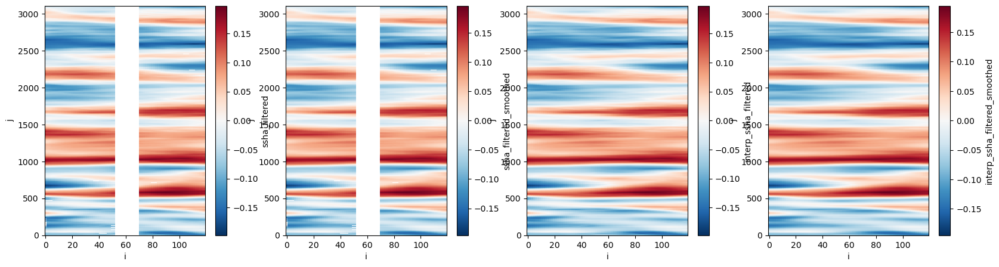

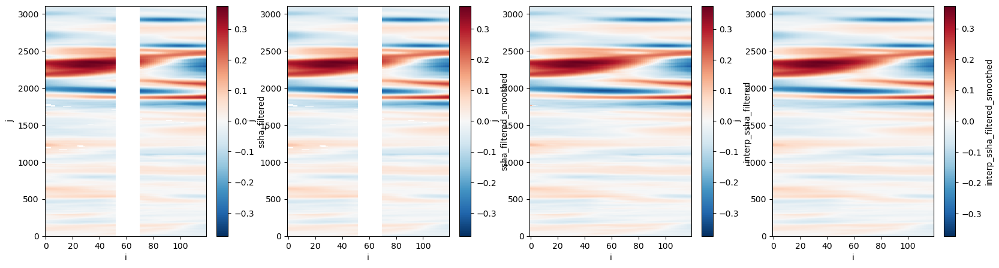

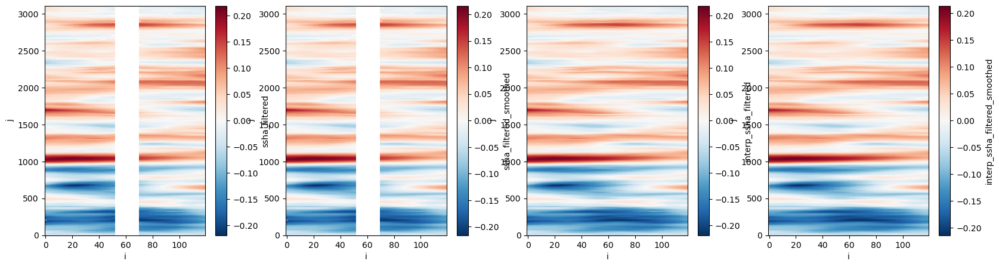

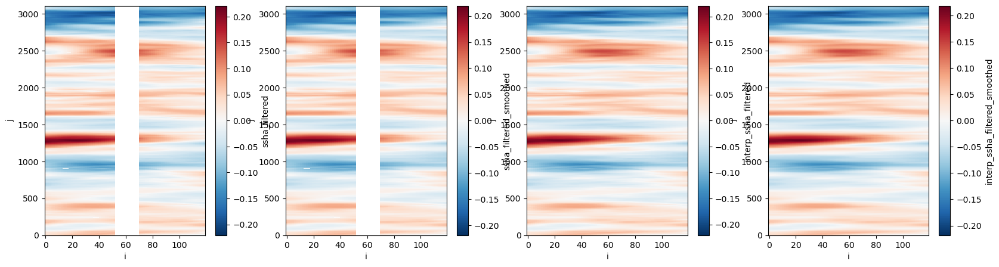

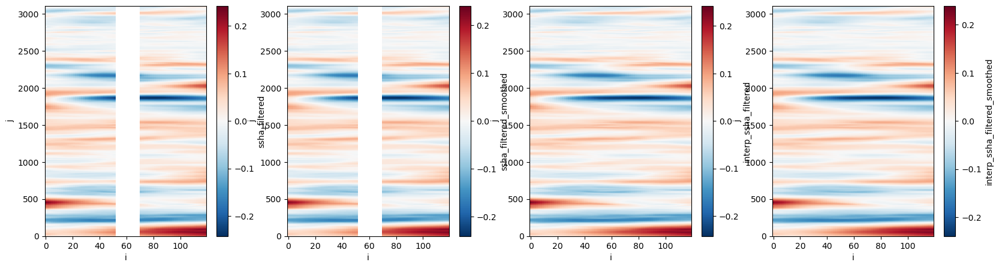

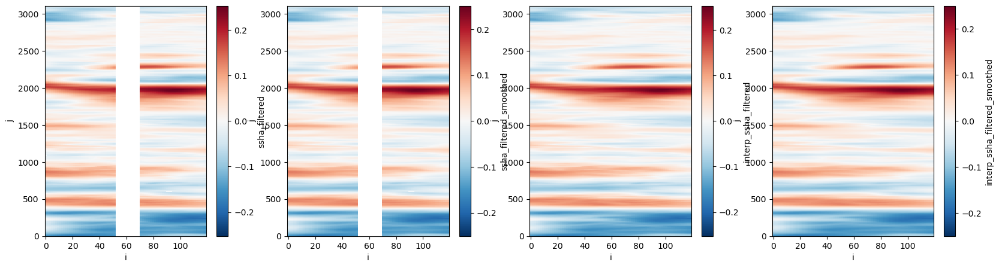

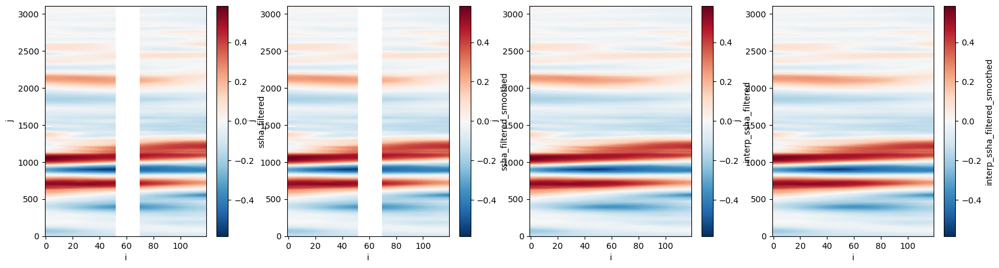

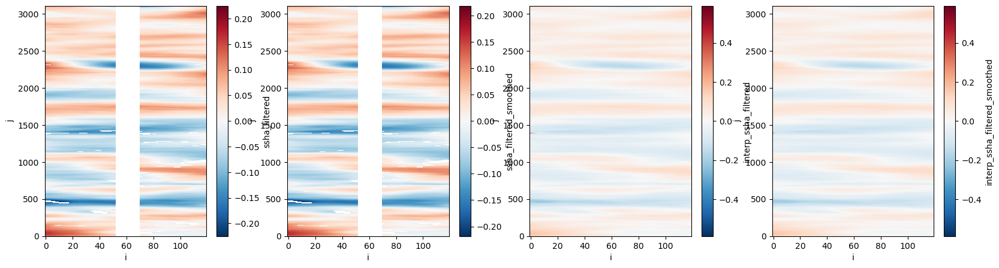

Using device: cuda
passID113
Processing ssh_chunks sample 1/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 2/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 3/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 4/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 5/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 6/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 7/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 8/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 9/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 10/24...
Adding ensemble data with shape: (1, 30, 1, 80, 80)
Processing ssh_chunks sample 11/24...
Adding ensemble data with shape: (1, 30, 1

In [4]:
# Physical constants (you might parameterize these)
f = -9.37e-5  # Coriolis parameter at ~40°S (s⁻¹)
g = 9.81      # gravitational acceleration (m/s²)
dx = dy = 1500  # grid spacing in m
dx_km = dx / 1000  # for plotting axis scale

base_path = "./tatsu_data"

# Load datasets
datasets = {
    'passID361': xr.open_dataset(f"{base_path}/cycle005_passID361.nc").compute(),
}

datasets = {
    'passID113': xr.open_dataset(f"{base_path}/cycle005_passID113.nc").compute(),
    'passID361': xr.open_dataset(f"{base_path}/cycle005_passID361.nc").compute(),
    'passID488': xr.open_dataset(f"{base_path}/cycle005_passID488.nc").compute(),
    'passID557': xr.open_dataset(f"{base_path}/cycle005_passID557.nc").compute(),
    'passID572': xr.open_dataset(f"{base_path}/cycle005_passID572.nc").compute(),

    'passID016': xr.open_dataset(f"{base_path}/cycle006_passID016.nc").compute(),
    'passID070': xr.open_dataset(f"{base_path}/cycle006_passID070.nc").compute(),
    'passID128': xr.open_dataset(f"{base_path}/cycle006_passID128.nc").compute()
}

passes = ["113","361","488","557","572","016","070","128"]
cycles = ["005","005","005","005","005","006","006","006"]

PASSES = list(datasets.keys())

sigma = 2.5
truncate = 0
g_filter = True
# Remove mean from SSHA fields
for key in datasets:
    ds = datasets[key]
    
    # Filter edges
    prior_mean = ds.ssha_filtered.mean().values
    nan_mask = ds.ssha_filtered.copy()*0
    if g_filter:
        # --- Apply Gaussian filtering to SSH field ---
        #nan_mask[:truncate+6,:] = np.nan
        #nan_mask[-truncate:,:] = np.nan
        #nan_mask[:,:truncate] = np.nan
        #nan_mask[:,-truncate:] = np.nan
        #nan_mask[:,35-truncate+2:47+truncate-2] = np.nan
        smoothed = gcm_filter(ds["ssha_filtered"],ds["ssha_filtered"].notnull()*1,sigma=sigma)
    else:
        smoothed = ds["ssha_filtered"]
    ds["ssha_filtered"] = ds["ssha_filtered"] - prior_mean + nan_mask*0 
    ds["ssha_filtered_smoothed"] = ds["ssha_filtered"]*0+smoothed - prior_mean + nan_mask*0 
    ds["interp_ssha_filtered_smoothed"] = gcm_filter(gcm_filter(ds.interp_ssha_filtered,ds.interp_ssha_filtered.fillna(0)*0+1,sigma=sigma),ds.interp_ssha_filtered.fillna(0)*0+1,sigma=sigma) - prior_mean
    ds["interp_ssha_filtered"] = ds.interp_ssha_filtered - prior_mean


    fig, axs = plt.subplots(1,4,figsize=(20,5))
    ds["ssha_filtered"].plot(ax=axs[0])
    ds["ssha_filtered_smoothed"].plot(ax=axs[1])
    ds["interp_ssha_filtered"].plot(ax=axs[2])
    ds["interp_ssha_filtered_smoothed"].plot(ax=axs[3])
    plt.show()
    plt.close()
    
# Setup
setup_random_seeds(42)
device = get_device()

base_path = "gs://leap-persistent/YueWang/SSH/data"

# Load datasets
train = open_zarr(f"{base_path}/train_80_sst.zarr")
test = open_zarr(f"{base_path}/test_80_sst.zarr")
zca = open_zarr(f"{base_path}/zca_80.zarr")

# ZCA transformation parameters
Vt = torch.from_numpy(zca.ubm_Vt.values).float().to(device)
scale = torch.from_numpy(zca.ubm_scale.values).float().to(device)
mean = torch.from_numpy(zca.ubm_mean.values).float().to(device)

# Prepare training data for normalization statistics
x_train_ssh_only = torch.from_numpy(train.ssh.values).float().unsqueeze(1).to(device)
x_train_normalized_ssh, min_vals_ssh, max_vals_ssh = min_max_normalize(x_train_ssh_only)

# Load model
model_ssh_only = UNet(in_channels=1, out_channels=2, initial_features=32, depth=4)
model_ssh_only.to(device)
checkpoint = torch.load('/home/jovyan/GRL_ssh/checkpoints/ssh_input_only.pth', map_location=device)
model_ssh_only.load_state_dict(checkpoint['model_state_dict'])
model_ssh_only.eval()

# === NEW CHUNKING LOGIC ===
chunk_size_j = 80
chunk_size_i = 80
batch_size = 8
n_samples = 30

eval_datasets_swot = {}
eval_datasets_swot_smoothed = {}
for key, ds in datasets.items():
    print(f"{key}")
    # Store subregions
    ssh_chunks = []
    ssh_chunks_smoothed = []
    nan_masks = []
    j_len = ds.dims['j']
    i_len = ds.dims['i']
    # Generate 80x80 chunks (non-overlapping)
    j_starts = list(range(0, j_len, chunk_size_j))[:-2]
    i_starts = [0]
    for j_start in j_starts:
        j_end = min(j_start + chunk_size_j, j_len)
        for i_start in i_starts:
            i_end = min(i_start + chunk_size_i, i_len)
            # Extract subregion
            sub_ssh = ds.interp_ssha_filtered.isel(j=slice(j_start, j_end), i=slice(i_start, i_end)).assign_coords({"i":np.arange(0,120,1.5),"j":np.arange(0,120,1.5),})
            sub_ssh_smoothed = ds.interp_ssha_filtered_smoothed.isel(j=slice(j_start, j_end), i=slice(i_start, i_end)).assign_coords({"i":np.arange(0,120,1.5),"j":np.arange(0,120,1.5),})
            # Create nan mask
            mask = np.copy(sub_ssh.values)
            mask[~np.isnan(mask)] = 1
            nan_masks.append(mask)
            # Append to lists
            ssh_chunks.append(sub_ssh)
            ssh_chunks_smoothed.append(sub_ssh_smoothed)

    # Now you can pass these lists directly into your evaluation logic
    # (instead of strong/weak SSH lists:
    eval_datasets_ssh = create_evaluation_datasets(
        ssh_chunks, 'ssh_chunks', model_ssh_only, min_vals_ssh, max_vals_ssh,
        Vt, scale, mean, batch_size, n_samples, device
    )
    eval_datasets_ssh_smoothed = create_evaluation_datasets(
        ssh_chunks_smoothed, 'ssh_chunks_smoothed', model_ssh_only, min_vals_ssh, max_vals_ssh,
        Vt, scale, mean, batch_size, n_samples, device
    )
    eval_datasets_swot[key] = eval_datasets_ssh
    eval_datasets_swot_smoothed[key] = eval_datasets_ssh_smoothed    



stiched_datasets_swot = {}
stiched_smoothed_datasets_swot = {}
stiched_passes = []
stiched_smoothed_passes = []
for key in datasets.keys():
    stiched_datasets_swot[key] = stitch_chunks_back(
                        eval_datasets_swot[key],
                        datasets[key],
                        chunk_size_j=chunk_size_j,
                        chunk_size_i=chunk_size_i,
                        i_start=0
                    )
    stiched_passes.append(stiched_datasets_swot[key])

    stiched_smoothed_datasets_swot[key] = stitch_chunks_back(
                        eval_datasets_swot_smoothed[key],
                        datasets[key],
                        chunk_size_j=chunk_size_j,
                        chunk_size_i=chunk_size_i,
                        i_start=0
                    )
    stiched_smoothed_passes.append(stiched_smoothed_datasets_swot[key])

stiched_fields_totals =[]
for i, ds in enumerate(datasets.keys()):
    #print(ds)
    datasets[ds]["ubm_pred_mean"] = stiched_passes[i]["ubm_pred_mean"]
    datasets[ds]["bm_pred_mean"] = stiched_passes[i]["bm_pred_mean"]

    datasets[ds]["ubm_smoothed_pred_mean"] = stiched_smoothed_passes[i]["ubm_pred_mean"]
    datasets[ds]["bm_smoothed_pred_mean"] = stiched_smoothed_passes[i]["bm_pred_mean"]
    

    stiched_fields_totals.append(analyze_and_plot_stitched(datasets[ds]))

In [5]:
# ------ Calculate chunk PSDs ------- 
psds_ssh_mean = {}
psds_ubm_mean = {}
psds_bm_mean = {}
psds_ubm_envelope = {}
psds_bm_envelope = {}

for name, ds in datasets.items():
    print(f"Processing {name}...")
    psds_ssh_mean[name] = {}
    psds_ubm_mean[name] = {}
    psds_bm_mean[name] = {}
    psds_ubm_envelope[name] = {}
    psds_bm_envelope[name] = {}
    for key, ds in eval_datasets_swot[name].items():
        # Remove the first patch which may have some edge effects
        if key == "ssh_chunks_0":
            continue
        psd_ssh, freq_ssh = calculate_psd_xrft_km(eval_datasets_swot[name][key].ssh.isel(sample=0),)
        psd_ubm, freq_ubm = calculate_psd_xrft_km(eval_datasets_swot[name][key].ubm_pred_mean.isel(sample=0),)
        psd_bm, freq_bm = calculate_psd_xrft_km(eval_datasets_swot[name][key].bm_pred_mean.isel(sample=0),)
        psd_ubm_ensemble, freq_ubm_ensemble = calculate_ensemble_psd_envelope(eval_datasets_swot[name][key].ubm_pred_samples.isel(sample=0),)
        psd_bm_ensemble, freq_bm_ensemble = calculate_ensemble_psd_envelope(eval_datasets_swot[name][key].bm_pred_samples.isel(sample=0),)

        psds_ssh_mean[name][key] = {"psd":psd_ssh,"freq":freq_ssh}
        psds_ubm_mean[name][key] = {"psd":psd_ubm,"freq":freq_ubm}
        psds_bm_mean[name][key] = {"psd":psd_bm,"freq":freq_bm} 
        psds_ubm_envelope[name][key] = {"psd":psd_ubm_ensemble,"freq":freq_ubm_ensemble}
        psds_bm_envelope[name][key] = {"psd":psd_bm_ensemble,"freq":freq_bm_ensemble} 


# -------------- Aggregate PSDs and plot -------------- #
    # Professional color palette
colors = {
    'ssh': '#1f77b4',      # Blue
    'bm': '#d62728',       # Red  
    'ubm': '#2ca02c',      # Green
    'reference': '#000000' # Black
}


i = 0
arr_ssh_psd_double_check = []
arr_ubm_psd_double_check = []
arr_bm_psd_double_check = []
for key, patches in psds_bm_envelope["passID361"].items():

    arr_ssh_psd, arr_ssh_freq = psds_ssh_mean["passID361"][key]["psd"],     psds_ssh_mean["passID361"][key]["freq"]
    arr_ubm_psd, arr_ubm_freq = psds_ubm_envelope["passID361"][key]["psd"], psds_ubm_envelope["passID361"][key]["freq"]
    arr_bm_psd,  arr_bm_freq  = psds_bm_envelope["passID361"][key]["psd"],  psds_bm_envelope["passID361"][key]["freq"]

    key_label = key
    
    if i < 1:
        arr_ssh_psd_mean = arr_ssh_psd.copy()
        arr_ubm_psd_mean = arr_ubm_psd.copy()
        arr_bm_psd_mean = arr_bm_psd.copy()
    else:
        arr_ssh_psd_mean += arr_ssh_psd
        for key in arr_ubm_psd_mean.keys():
            arr_ubm_psd_mean[key] += arr_ubm_psd[key]
        for key in arr_bm_psd_mean.keys():
            arr_bm_psd_mean[key] += arr_bm_psd[key]        



Processing passID113...
Processing passID361...
Processing passID488...
Processing passID557...
Processing passID572...
Processing passID016...
Processing passID070...
Processing passID128...


# Plot results

Processing passID113...
arr_ubm_psd_mean min 1.966633452831083e-05
arr_ubm_psd_mean max 8.737926084085597e-05
arr_bm_psd_mean min 0.0005444545654979913
arr_bm_psd_mean max 0.0008445437452507478


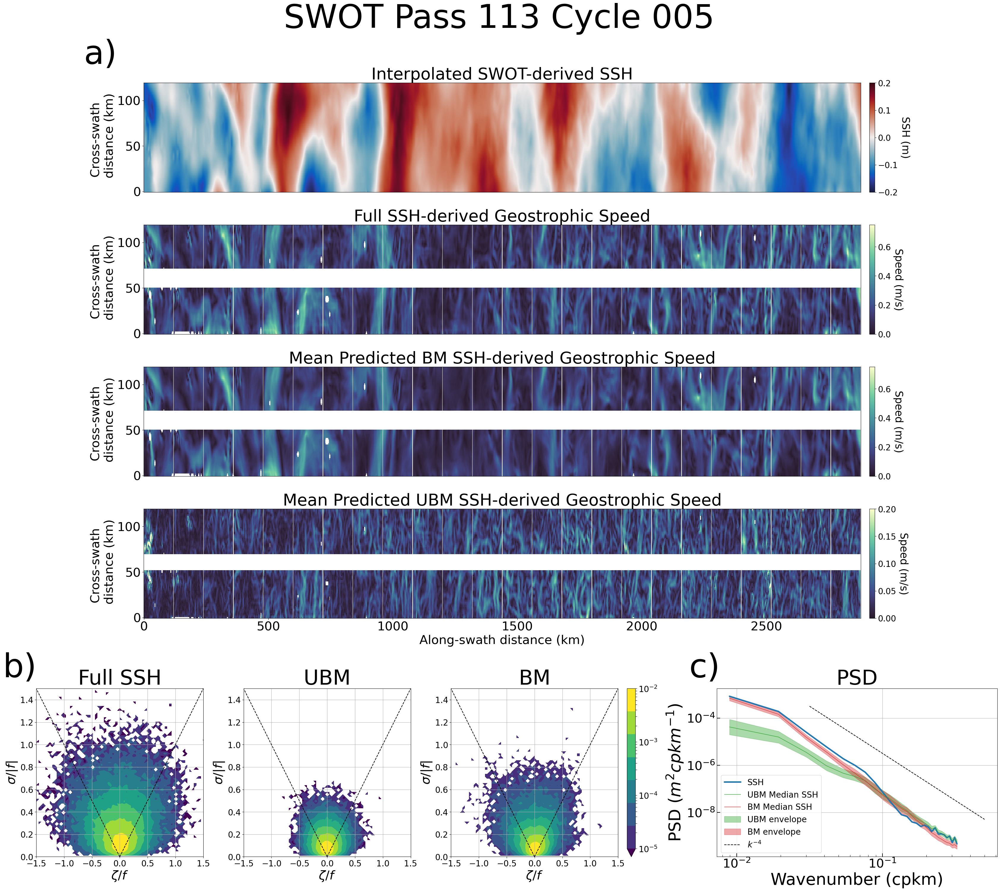

Processing passID361...
arr_ubm_psd_mean min 1.8628226846840996e-05
arr_ubm_psd_mean max 0.0001308475034492267
arr_bm_psd_mean min 0.002983789300954984
arr_bm_psd_mean max 0.0039078310128833945


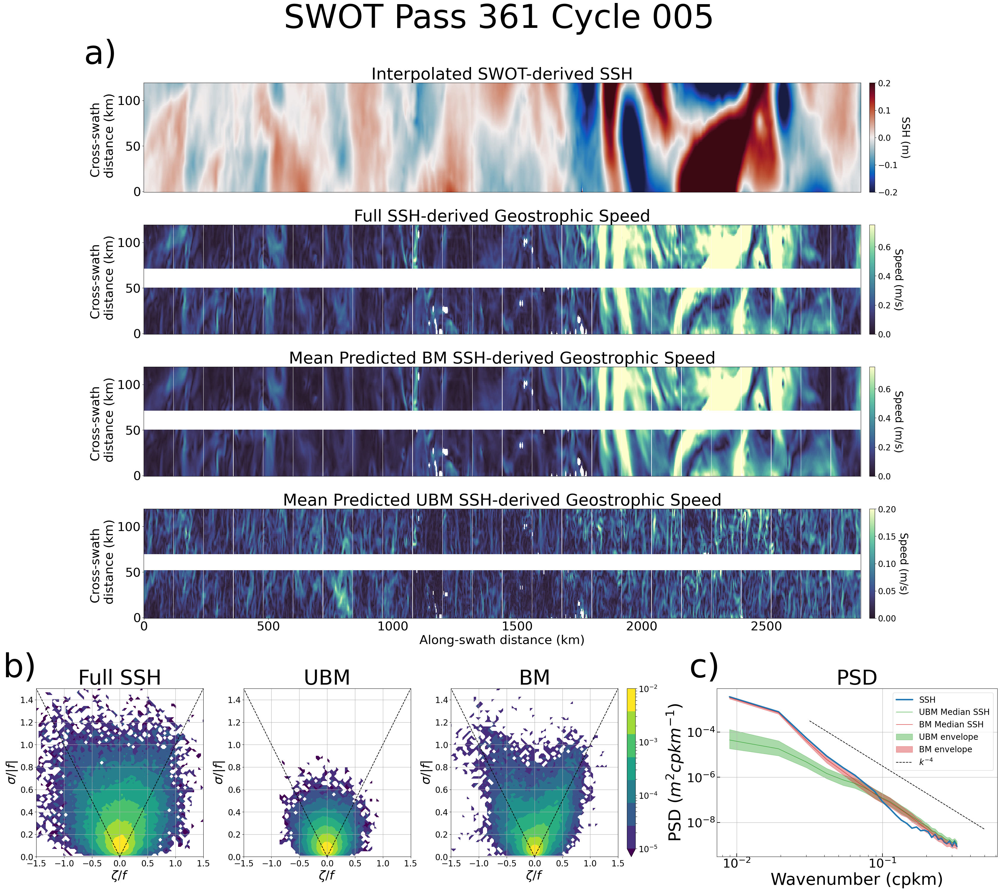

Processing passID488...
arr_ubm_psd_mean min 3.3983603234262065e-05
arr_ubm_psd_mean max 0.00012361207960868048
arr_bm_psd_mean min 0.0004864061488788119
arr_bm_psd_mean max 0.0008028490819184224


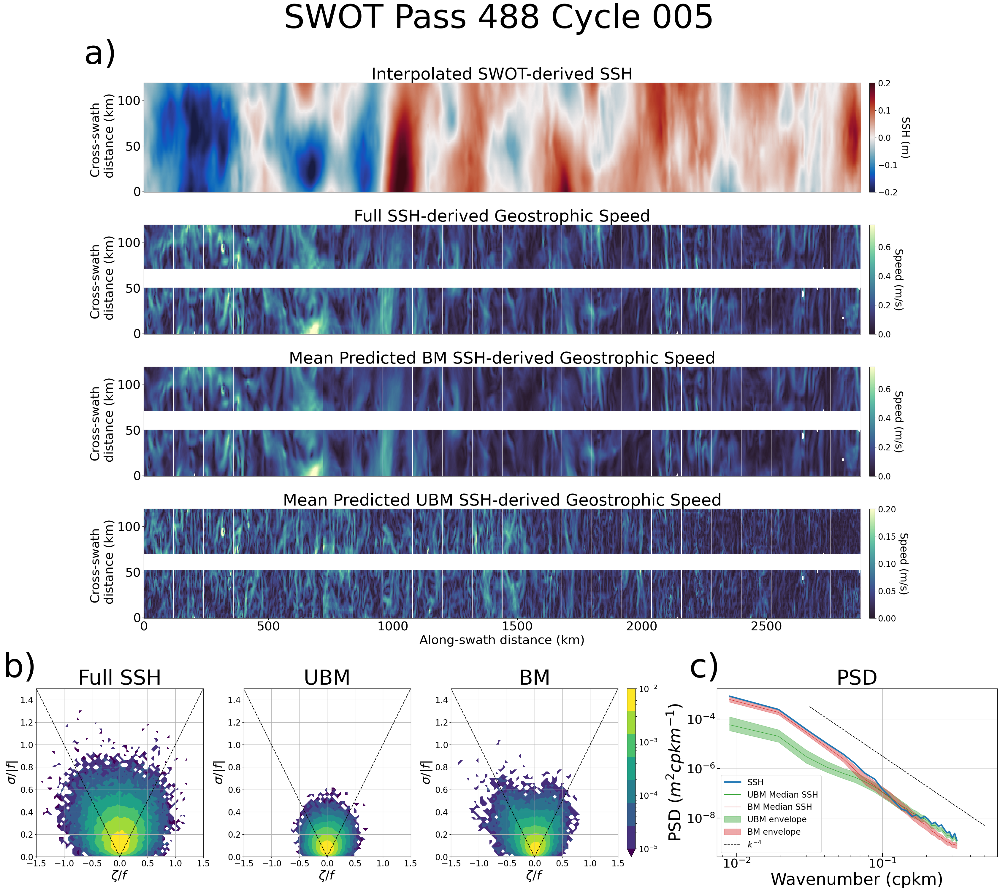

Processing passID557...
arr_ubm_psd_mean min 1.6950885034750163e-05
arr_ubm_psd_mean max 6.936750465962354e-05
arr_bm_psd_mean min 0.0002920986586187236
arr_bm_psd_mean max 0.0005183581498858571


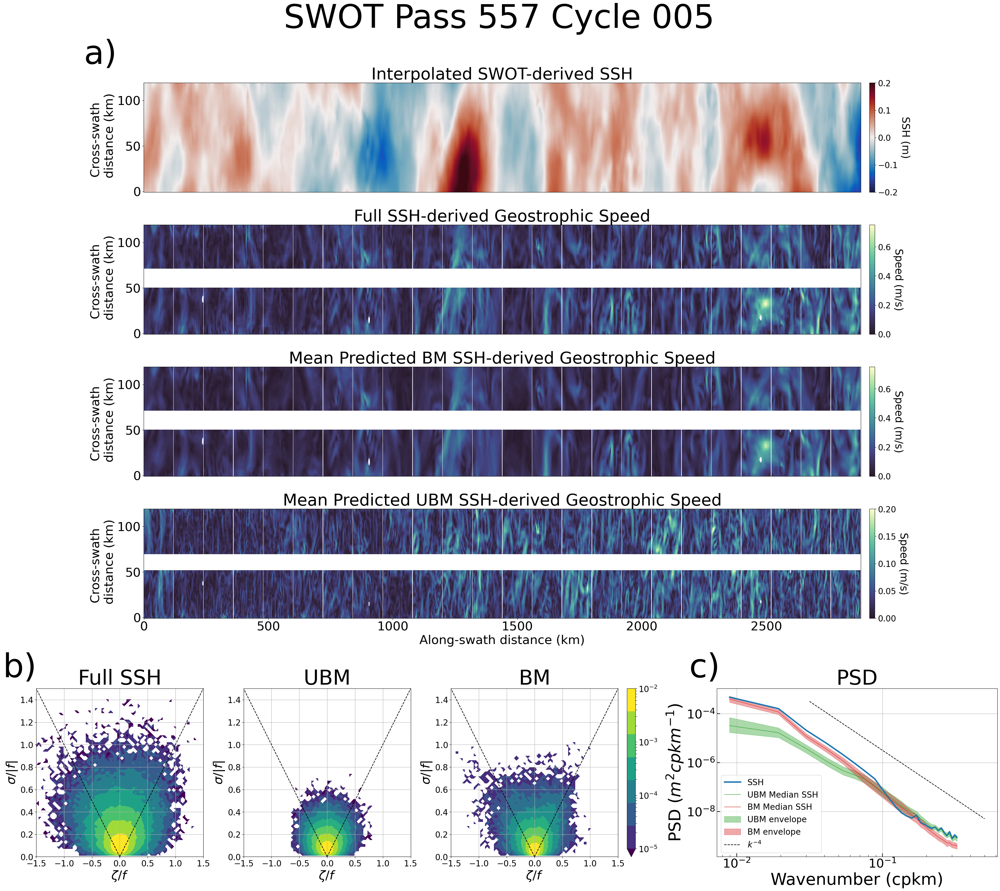

Processing passID572...
arr_ubm_psd_mean min 3.398436780667786e-05
arr_ubm_psd_mean max 9.738014418290159e-05
arr_bm_psd_mean min 0.0008142376924232011
arr_bm_psd_mean max 0.0010383621776014643


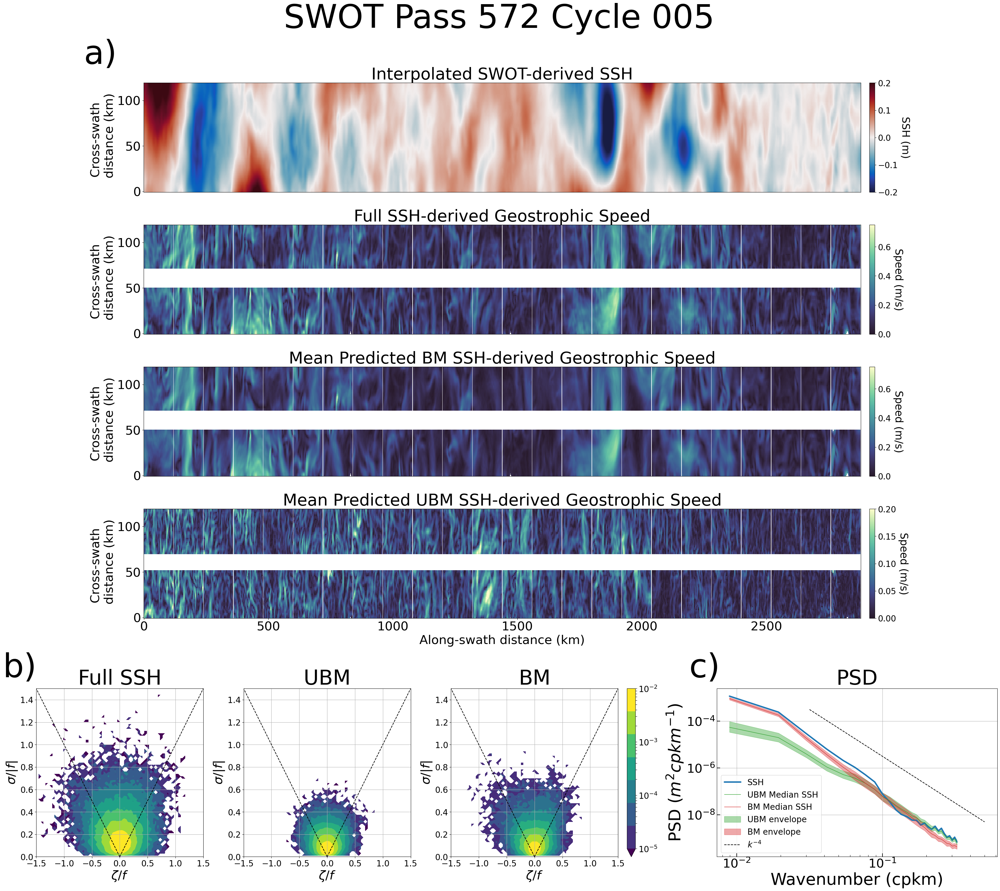

Processing passID016...
arr_ubm_psd_mean min 2.9524024078255293e-05
arr_ubm_psd_mean max 0.00012093677676931312
arr_bm_psd_mean min 0.0004626975926583878
arr_bm_psd_mean max 0.0007030840221717615


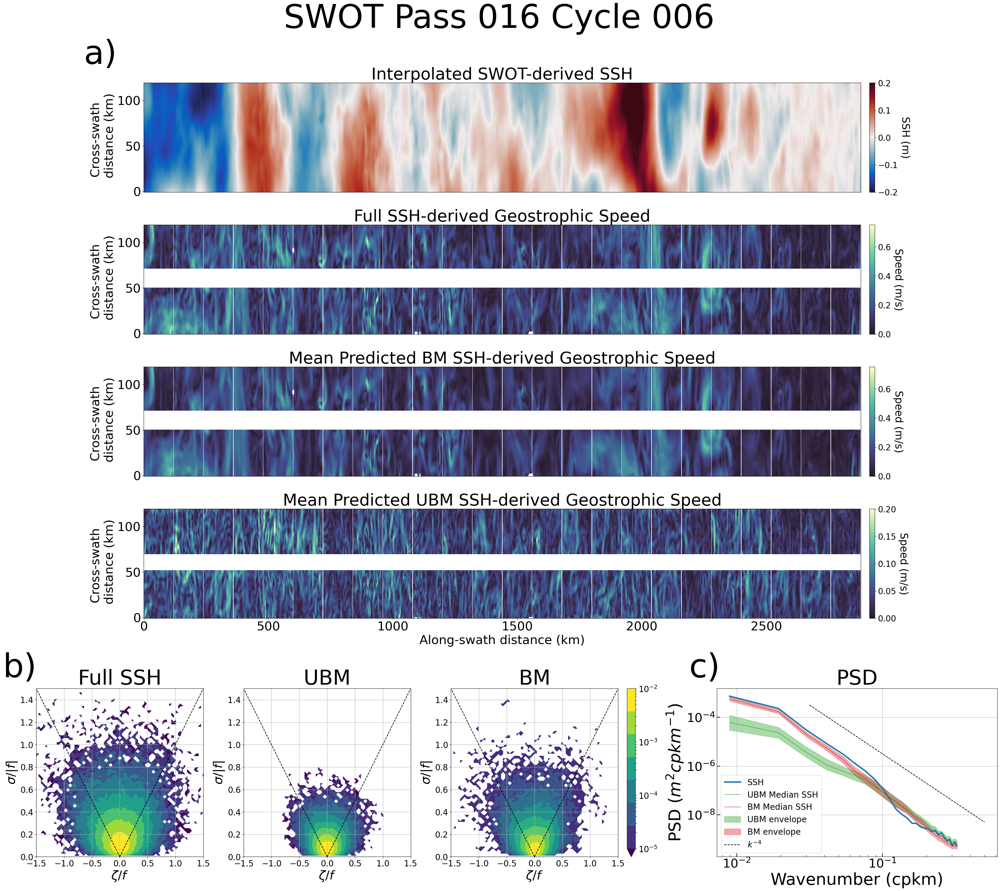

Processing passID070...
arr_ubm_psd_mean min 1.552867558514748e-05
arr_ubm_psd_mean max 8.844951972980301e-05
arr_bm_psd_mean min 0.0025393905441423127
arr_bm_psd_mean max 0.0032047952262809517


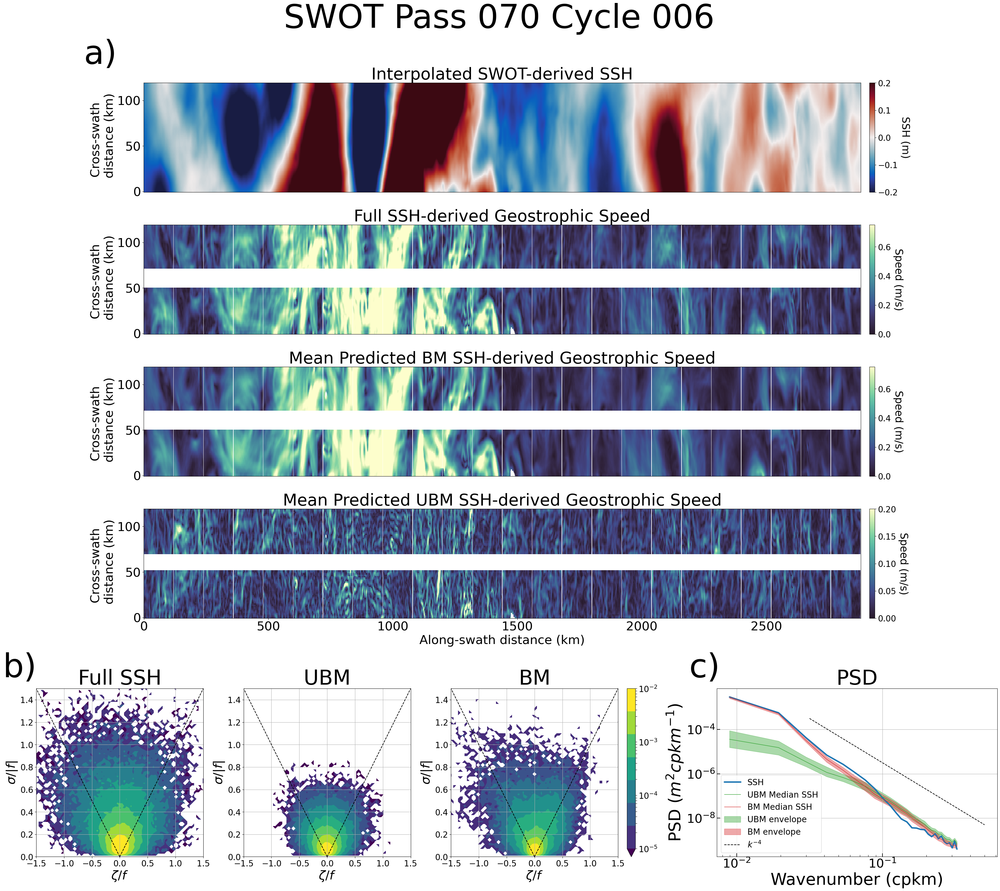

Processing passID128...
arr_ubm_psd_mean min 2.5431452163598502e-05
arr_ubm_psd_mean max 0.00018318383481257149
arr_bm_psd_mean min 0.0004937819951004465
arr_bm_psd_mean max 0.0009364310744952992


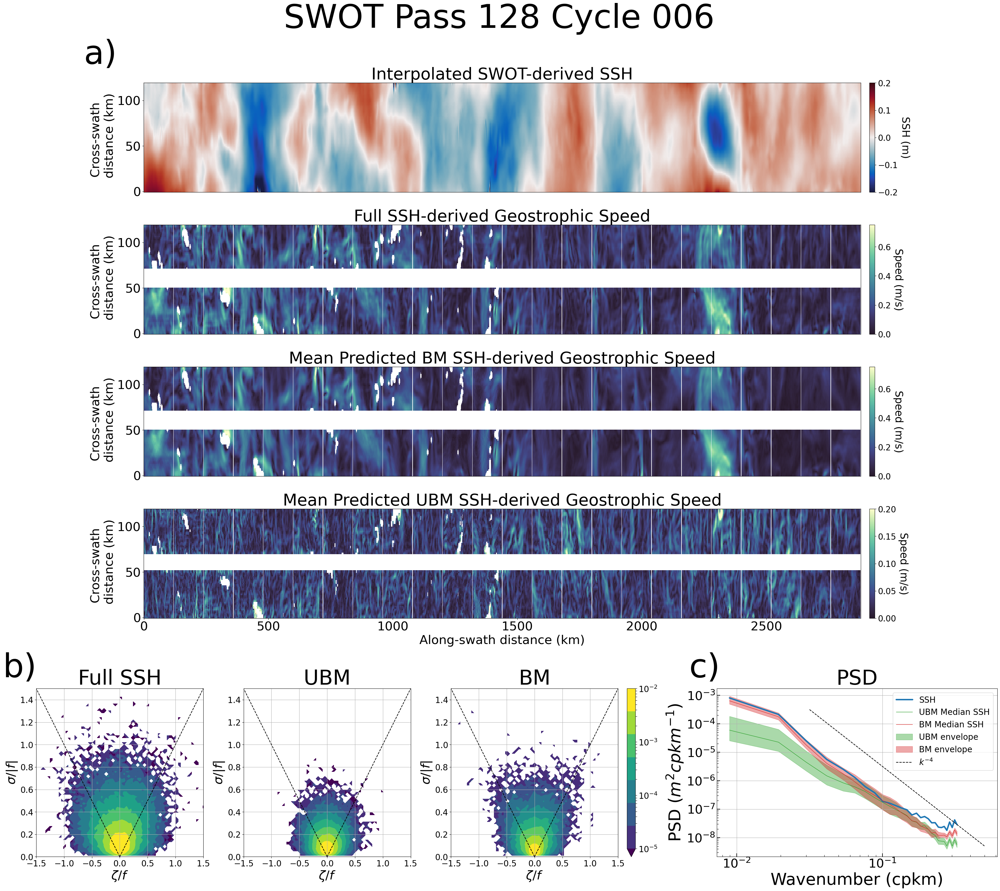

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors as cols
from matplotlib.ticker import LogLocator
import matplotlib.cm as mplcm
import string
from matplotlib.gridspec import GridSpec

# CONFIGURATION
segment_size = 80
n_j = 2072

# Color scale limits for Plot 1
vmin, vmax = -.2, .2
sp_vmin, sp_vmax = 0, .75
sp_ubm_vmin, sp_ubm_vmax = 0, .2
ij_min, ij_max = 6, -6
cmap_ssh = cmo.balance
cmap_vel = cmo.deep_r
cmap_vort = cmo.balance
cmap_strain = cmo.ice
cbar_pad = 0.01

# Configuration for Plot 2 (JPDF)
vortband01 = np.linspace(-2, 2, 100)
strainband01 = np.linspace(0, 2, 100)
cmap_jpdf = mplcm.viridis
cmap_jpdf.set_under('#440154')
cmap_jpdf.set_over('#FDE725')
binbox01 = (vortband01[1]-vortband01[0])*(strainband01[1]-strainband01[0])
levels = np.logspace(-5, -2, 8)
norm = cols.LogNorm(vmin=1e-5, vmax=1e-2)
j_start = 80*4
jpdf_ij_min, jpdf_ij_max = 0, None
skip_i = 1

titles = ["Interpolated SWOT-derived SSH",
          r"Full SSH-derived Geostrophic Speed",
          r"Mean Predicted BM SSH-derived Geostrophic Speed",
          r"Mean Predicted UBM SSH-derived Geostrophic Speed",
         ]

labels = ["SSH (m)",
          "Speed (m/s)",
          "Speed (m/s)",
          "Speed (m/s)",
         ]

# MAIN LOOP
reverse = False
for loop_idx, (name, ds) in enumerate(datasets.items()):
    print(f"Processing {name}...")
    f_plot1 = -2*7.2921e-5*np.sin(ds.latitude*np.pi/180)
    f_plot2 = 2*7.2921e-5*np.sin(ds.latitude*np.pi/180)

    # --- Create main figure with GridSpec ---
    fig = plt.figure(figsize=(40, 30))
    
    # Create outer GridSpec: 2 rows (1 for top four plots, 1 for bottom four)
    outer_gs = fig.add_gridspec(2, 1, 
                          height_ratios=[3.5, 1.1],  # 4 equal top rows, smaller bottom
                          hspace=0.2,  # Vertical spacing between plots
                          wspace=0.4,   # Horizontal spacing (affects bottom row)
                          top=0.92,
                          bottom=0.05,
                          left=0.05,
                          right=0.95)
    # ========== TOP 4 PLOTS (rows, full width) ==========
    upper_gs = gridspec.GridSpecFromSubplotSpec(4, 30, subplot_spec=outer_gs[0], hspace=0.3) 
    axs_top = [
        fig.add_subplot(upper_gs[0,3:27]),  # Row 0, all columns
        fig.add_subplot(upper_gs[1,3:27]),  # Row 1, all columns
        fig.add_subplot(upper_gs[2,3:27]),  # Row 2, all columns
        fig.add_subplot(upper_gs[3,3:27]),  # Row 3, all columns
    ]
    # ========== BOTTOM 4 PLOTS (columns, variable width) ==========
    # Using 30 columns makes it easy to span 24 columns (80%) for bottom plots
    lower_gs = gridspec.GridSpecFromSubplotSpec(1, 30, subplot_spec=outer_gs[1], hspace=0.2) 
    ax_jpdf1 = fig.add_subplot(lower_gs[0:5])    # JPDF 1 - SSH
    ax_jpdf2 = fig.add_subplot(lower_gs[6:11])   # JPDF 2 - UBM
    ax_jpdf3 = fig.add_subplot(lower_gs[12:17])  # JPDF 3 - BM
    ax_psd = fig.add_subplot(lower_gs[19:27])    # PSD plot
    axs_bottom_left = [ax_jpdf1, ax_jpdf2, ax_jpdf3]

    
    # Plot data
    if reverse:
        im0 = axs_top[0].pcolor(ds.j[:1920].j, ds.i, (ds.interp_ssha_filtered[::-1,:])[152:,:].T, 
                                vmin=vmin, vmax=vmax, cmap=cmap_ssh)
        im1 = axs_top[1].pcolor(ds.j[:1920].j, ds.i, (ds.speed_ssh[::-1,:])[152:,:].T, 
                                vmin=sp_vmin, vmax=sp_vmax, cmap=cmap_vel)
        im2 = axs_top[2].pcolor(ds.j[:1920].j, ds.i, (ds.speed_bm[::-1,:])[152:,:].T, 
                                vmin=sp_vmin, vmax=sp_vmax, cmap=cmap_vel)
        im3 = axs_top[3].pcolor(ds.j[:1920].j, ds.i, (ds.speed_ubm[::-1,:])[152:,:].T, 
                                vmin=sp_ubm_vmin, vmax=sp_ubm_vmax, cmap=cmap_vel)
    else:
        im0 = axs_top[0].pcolor(ds.j[:1920].j, ds.i, ds.interp_ssha_filtered[:1920,:].T, 
                                vmin=vmin, vmax=vmax, cmap=cmap_ssh)
        im1 = axs_top[1].pcolor(ds.j[:1920].j, ds.i, ds.speed_ssh[:1920,:].T, 
                                vmin=sp_vmin, vmax=sp_vmax, cmap=cmap_vel)
        im2 = axs_top[2].pcolor(ds.j[:1920].j, ds.i, ds.speed_bm[:1920,:].T, 
                                vmin=sp_vmin, vmax=sp_vmax, cmap=cmap_vel)
        im3 = axs_top[3].pcolor(ds.j[:1920].j, ds.i, ds.speed_ubm[:1920,:].T, 
                                vmin=sp_ubm_vmin, vmax=sp_ubm_vmax, cmap=cmap_vel)
    
    # Format top axes
    for i, ax in enumerate(axs_top):
        ax.set_title(titles[i], fontsize=40)
        ax.set_ylabel("Cross-swath \n distance (km)", fontsize=30)
        ax.tick_params(axis='both', labelsize=30)
        if i < len(axs_top) - 1:
            ax.tick_params(labelbottom=False, bottom=False)
        else:
            ax.set_xlabel("Along-swath distance (km)", fontsize=30)
    
    # Add colorbars for top plots
    cbar0 = fig.colorbar(im0, ax=axs_top[0], pad=cbar_pad)
    cbar0.set_label(labels[0], fontsize=25, rotation=270, labelpad=30)
    cbar0.ax.tick_params(labelsize=20)
    cbar1 = fig.colorbar(im1, ax=axs_top[1], pad=cbar_pad)
    cbar1.set_label(labels[1], fontsize=25, rotation=270, labelpad=30)
    cbar1.ax.tick_params(labelsize=20)
    cbar2 = fig.colorbar(im2, ax=axs_top[2], pad=cbar_pad)
    cbar2.set_label(labels[2], fontsize=25, rotation=270, labelpad=30)
    cbar2.ax.tick_params(labelsize=20)
    cbar3 = fig.colorbar(im3, ax=axs_top[3], pad=cbar_pad)
    cbar3.set_label(labels[3], fontsize=25, rotation=270, labelpad=30)
    cbar3.ax.tick_params(labelsize=20)


    
    # ========== JPDF Plots ==========
    # Calculate histograms
    vort_ssh = (ds.vort_ssh[j_start:, jpdf_ij_min:jpdf_ij_max]/f_plot2).rename('vort_ssh')
    vort_ubm = (ds.vort_ubm[j_start:, jpdf_ij_min:jpdf_ij_max]/f_plot2).rename('vort_ubm')
    vort_bm = (ds.vort_bm[j_start:, jpdf_ij_min:jpdf_ij_max]/f_plot2).rename('vort_bm')
    strain_ssh = (ds.strain_ssh[j_start:, jpdf_ij_min:jpdf_ij_max]/-f_plot2).rename('strain_ssh')
    strain_ubm = (ds.strain_ubm[j_start:, jpdf_ij_min:jpdf_ij_max]/-f_plot2).rename('strain_ubm')
    strain_bm = (ds.strain_bm[j_start:, jpdf_ij_min:jpdf_ij_max]/-f_plot2).rename('strain_bm')
    hist_ssh = histogram(vort_ssh, strain_ssh, dim=['j','i'], bins=[vortband01, strainband01])
    hist_ubm = histogram(vort_ubm, strain_ubm, dim=['j','i'], bins=[vortband01, strainband01])
    hist_bm = histogram(vort_bm, strain_bm, dim=['j','i'], bins=[vortband01, strainband01])
    hist_ssh = hist_ssh.fillna(0)
    hist_ubm = hist_ubm.fillna(0)
    hist_bm = hist_bm.fillna(0)
    
    # Plot JPDFs
    ims = [
        (hist_ssh.T/hist_ssh.sum()).plot.contourf(ax=axs_bottom_left[0], add_colorbar=False, 
                                                   levels=levels, norm=norm, cmap=cmap_jpdf, 
                                                   vmin=levels[0], vmax=levels[-1]),
        (hist_ubm.T/hist_ubm.sum()).plot.contourf(ax=axs_bottom_left[1], add_colorbar=False, 
                                                   levels=levels, norm=norm, cmap=cmap_jpdf, 
                                                   vmin=levels[0], vmax=levels[-1]),
        (hist_bm.T/hist_bm.sum()).plot.contourf(ax=axs_bottom_left[2], add_colorbar=False, 
                                                 levels=levels, norm=norm, cmap=cmap_jpdf),
    ]
    
    # Format JPDF axes
    for ax in axs_bottom_left:
        ax.plot(np.linspace(0, -7, 10), np.linspace(0, 7, 10), 'k--')
        ax.plot(np.linspace(0, 7), np.linspace(0, 7), 'k--')
        ax.grid()
        ax.set_xlabel('$\\zeta$/$f$', fontsize=30)
        ax.set_ylabel('$\\sigma$/$|f|$', fontsize=30)
        ax.set_ylim(0, 1.5)
        ax.set_xlim(-1.5, 1.5)
        ax.tick_params(axis='both', labelsize=20)
    axs_bottom_left[0].set_title("Full SSH", fontsize=50)
    axs_bottom_left[1].set_title("UBM", fontsize=50)
    axs_bottom_left[2].set_title("BM", fontsize=50)
    
    # Add shared colorbar for JPDF
    cbar_jpdf = fig.colorbar(ims[0], ax=axs_bottom_left, orientation='vertical', 
                             extend="both", fraction=0.02, pad=0.015, 
                             ticks=LogLocator(subs=range(10)))
    cbar_jpdf.ax.tick_params(labelsize=20)
    
    # ========== PSD Plot ==========
    i = 0
    count_i = 0
    for key, patches in psds_bm_envelope[name].items():
        arr_ssh_psd, arr_ssh_freq = psds_ssh_mean[name][key]["psd"], psds_ssh_mean[name][key]["freq"]
        arr_ubm_psd, arr_ubm_freq = psds_ubm_envelope[name][key]["psd"], psds_ubm_envelope[name][key]["freq"]
        arr_bm_psd, arr_bm_freq = psds_bm_envelope[name][key]["psd"], psds_bm_envelope[name][key]["freq"]

        key_label = key
        if i < skip_i:
            i += 1
            continue
        elif i == skip_i:
            arr_ssh_psd_mean = arr_ssh_psd.copy()
            arr_ubm_psd_mean = arr_ubm_psd.copy()
            arr_bm_psd_mean = arr_bm_psd.copy()
            i += 1
            count_i += 1
        else:
            arr_ssh_psd_mean += arr_ssh_psd
            for key in arr_ubm_psd_mean.keys():
                arr_ubm_psd_mean[key] += arr_ubm_psd[key]
            for key in arr_bm_psd_mean.keys():
                arr_bm_psd_mean[key] += arr_bm_psd[key]
            i += 1
            count_i += 1

    # SSH (reference)
    ax_psd.plot(arr_ubm_freq, 
                arr_ssh_psd_mean/count_i, 
                color=colors['ssh'], 
                linewidth=3.5, label='SSH',
                solid_capstyle='round')
    ax_psd.plot(arr_ubm_freq, 
                arr_ubm_psd_mean['median']/count_i, 
                color=colors['ubm'], 
                linewidth=1, label='UBM Median SSH',
                solid_capstyle='round')
    ax_psd.plot(arr_ubm_freq,
                arr_bm_psd_mean['median']/count_i,
                color=colors['bm'], 
                linewidth=1, label='BM Median SSH',
                solid_capstyle='round')

    # UBM uncertainty envelope
    ax_psd.fill_between(arr_ubm_freq, 
                        arr_ubm_psd_mean['min']/count_i, 
                        arr_ubm_psd_mean['max']/count_i,
                        color=colors['ubm'], 
                        alpha=0.4, label='UBM envelope')
    # BM uncertainty envelope
    ax_psd.fill_between(arr_ubm_freq, 
                        arr_bm_psd_mean['min']/count_i, 
                        arr_bm_psd_mean['max']/count_i,
                        color=colors['bm'], 
                        alpha=0.4, label='BM envelope')

    print("arr_ubm_psd_mean min", (arr_ubm_psd_mean['min']/count_i)[0])
    print("arr_ubm_psd_mean max", (arr_ubm_psd_mean['max']/count_i)[0])
    print("arr_bm_psd_mean min", (arr_bm_psd_mean['min']/count_i)[0])
    print("arr_bm_psd_mean max", (arr_bm_psd_mean['max']/count_i)[0])
    
    ax_psd.set_title(f"PSD", fontsize=50)
    ax_psd.tick_params(axis='both', which='major', labelsize=30, length=8, 
                       width=1.5, direction='in')
    ax_psd.tick_params(axis='both', which='minor', length=4, 
                       width=0.8, direction='in')
    ax_psd.set_xscale('log')
    ax_psd.set_yscale('log')
    ax_psd.set_ylabel(r"PSD $(m^{2} cpkm^{-1})$", fontsize=40)
    ax_psd.set_xlabel(r"Wavenumber (cpkm)", fontsize=40)
    ax_psd.grid()
    
    # Generate x values (avoid 0 for log plots)
    x = np.logspace(-1.5, -.3, 100)
    # Define the line: y = k * x^m
    m = -4
    k = 10**-1.5
    y = k * x**m
    # Create the log-log plot
    ax_psd.loglog(x, y*10**-8, color='k', linestyle="--", label=r"$k^{-4}$")
    ax_psd.legend(fontsize=20)

    # Overall title
    fig.suptitle(f"SWOT Pass {passes[loop_idx]} Cycle {cycles[loop_idx]}", 
                 fontsize=80, y=1.01, x=0.44)


    # Add subplot label
    fig.text(0.09, .97, f"{string.ascii_lowercase[0]})", 
             fontsize=80, verticalalignment='top', horizontalalignment='left')
    
    fig.text(0.022, .28, f"{string.ascii_lowercase[1]})", 
             fontsize=80, verticalalignment='top', horizontalalignment='left')

    fig.text(0.60, .28, f"{string.ascii_lowercase[2]})", 
             fontsize=80, verticalalignment='top', horizontalalignment='left')
    
    plt.show()
    plt.close()

